In [7]:
# 인터랙티브 애니메이션의 일괄적 종료를 위한 코드: 서로 다른 코드셀의 인터랙티브셀간에 간섭이 일어나서 가급적 아예 독립적인 노트북에서 실행할 것.

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# 'fig'는 이전에 plt.subplots()로 생성한 Figure 객체입니다.
# plt.close(fig)

# 만약 열려있는 모든 Figure를 닫고 싶다면:
plt.close('all')

#### 1. PCA

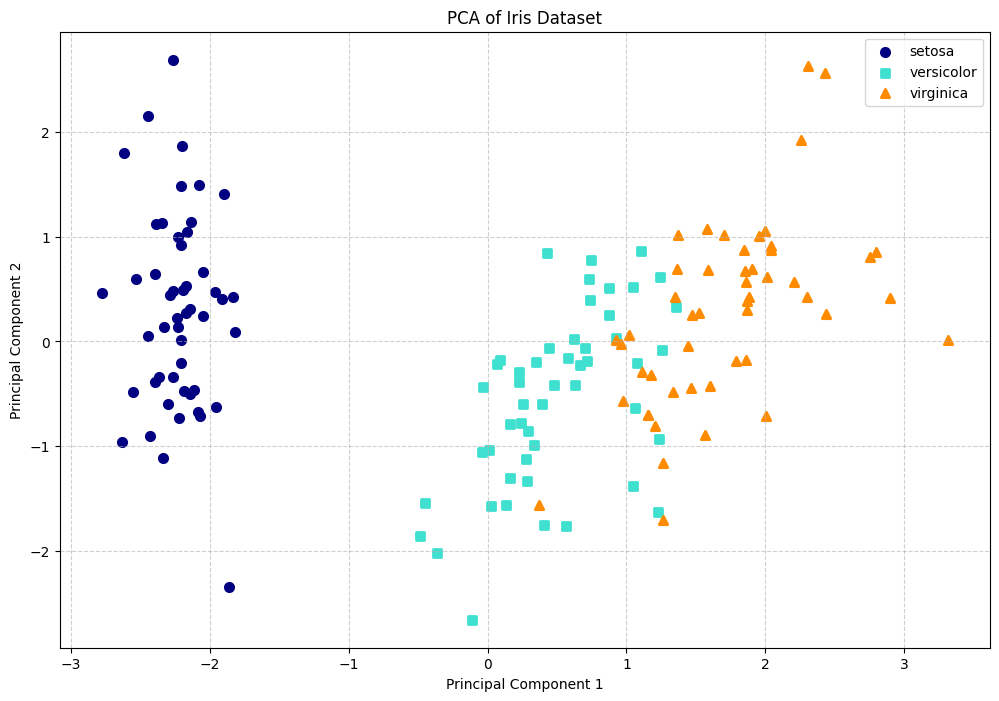

In [1]:
# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# 데이터 처리를 위한 numpy, 시각화를 위한 matplotlib,
# PCA와 데이터셋을 위한 scikit-learn을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler


# ==============================================================================
# 단계 2: 데이터 준비 (고차원 데이터 로드 및 정규화)
# ------------------------------------------------------------------------------
# 예제로 사용할 붓꽃(Iris) 데이터셋을 로드합니다.
# PCA는 데이터의 스케일에 민감하므로 StandardScaler를 사용하여 표준화를 진행합니다.
# ==============================================================================
iris = load_iris()
X = iris.data  # 4개의 특성을 가진 고차원 데이터 (sepal length, sepal width, petal length, petal width)
y = iris.target
target_names = iris.target_names

# 데이터 정규화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# ==============================================================================
# 단계 3: 차원 축소 적용 (PCA 모델 생성 및 학습)
# ------------------------------------------------------------------------------
# PCA 모델을 생성하고, 2개의 주성분(2차원)으로 데이터를 변환합니다.
# n_components는 축소할 차원의 수를 의미합니다.
# ==============================================================================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)


# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 결과를 플로팅할 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 8))


# ==============================================================================
# 단계 5: 차원 축소 결과 시각화 (데이터 플로팅)
# ------------------------------------------------------------------------------
# 2차원으로 축소된 데이터를 산점도(scatter plot)로 시각화합니다.
# 각 품종(target)에 따라 다른 색상과 마커로 표시하여 분포를 확인합니다.
# ==============================================================================
colors = ['navy', 'turquoise', 'darkorange']
markers = ['o', 's', '^']

for color, marker, i, target_name in zip(colors, markers, [0, 1, 2], target_names):
    ax.scatter(X_pca[y == i, 0], X_pca[y == i, 1],
               color=color, marker=marker, lw=2, label=target_name)


# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 범례 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 추가 설정입니다.
# ==============================================================================
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('PCA of Iris Dataset')
ax.legend(loc='best', shadow=False, scatterpoints=1)
ax.grid(True, linestyle='--', alpha=0.6)


# ==============================================================================
# 단계 7: 최종 출력
# ------------------------------------------------------------------------------
# 완성된 그래프를 화면에 표시합니다.
# ==============================================================================
plt.show()

#### 2. t-SNE

C:\Users\kazuk\AppData\Local\Temp\ipykernel_18648\509073520.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap=plt.cm.get_cmap("jet", 10))


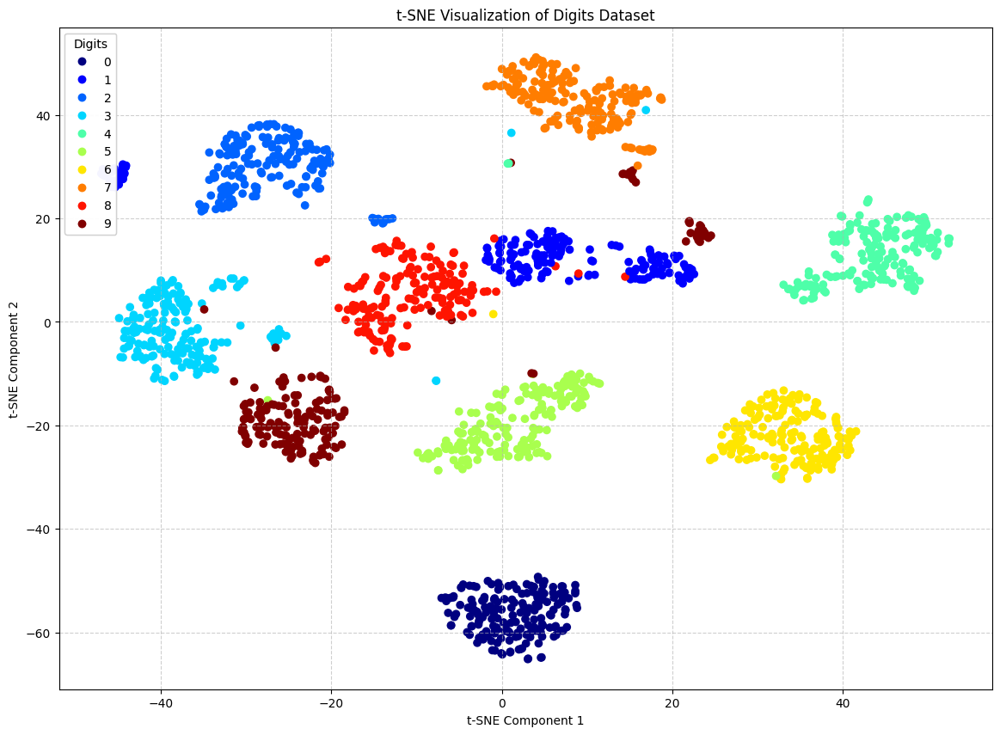

In [2]:
# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# 데이터 처리를 위한 numpy, 시각화를 위한 matplotlib,
# t-SNE와 데이터셋을 위한 scikit-learn을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import load_digits


# ==============================================================================
# 단계 2: 데이터 준비 (고차원 데이터 로드)
# ------------------------------------------------------------------------------
# 예제로 사용할 숫자 필기체(Digits) 데이터셋을 로드합니다.
# 이 데이터는 8x8 이미지로, 64차원의 벡터로 표현됩니다.
# ==============================================================================
digits = load_digits()
X = digits.data  # 64개의 특성을 가진 고차원 데이터
y = digits.target


# ==============================================================================
# 단계 3: 차원 축소 적용 (t-SNE 모델 생성 및 학습)
# ------------------------------------------------------------------------------
# t-SNE 모델을 생성하고, 2차원으로 데이터를 변환합니다.
# n_components는 축소할 차원의 수를 의미합니다.
# random_state를 설정하여 실행할 때마다 동일한 결과를 얻도록 합니다.
# ==============================================================================
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)


# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 결과를 플로팅할 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(14, 10))


# ==============================================================================
# 단계 5: 차원 축소 결과 시각화 (데이터 플로팅)
# ------------------------------------------------------------------------------
# 2차원으로 축소된 데이터를 산점도(scatter plot)로 시각화합니다.
# 각 숫자(0~9)에 따라 다른 색상으로 표시하여 군집을 확인합니다.
# ==============================================================================
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap=plt.cm.get_cmap("jet", 10))


# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 컬러바 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 추가 설정입니다.
# ==============================================================================
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_title('t-SNE Visualization of Digits Dataset')
ax.grid(True, linestyle='--', alpha=0.6)

# 색상 막대(colorbar)를 추가하여 각 색상이 어떤 숫자를 나타내는지 보여줍니다.
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="upper left", title="Digits")
ax.add_artist(legend1)


# ==============================================================================
# 단계 7: 최종 출력
# ------------------------------------------------------------------------------
# 완성된 그래프를 화면에 표시합니다.
# ==============================================================================
plt.show()

#### 3. Score Field

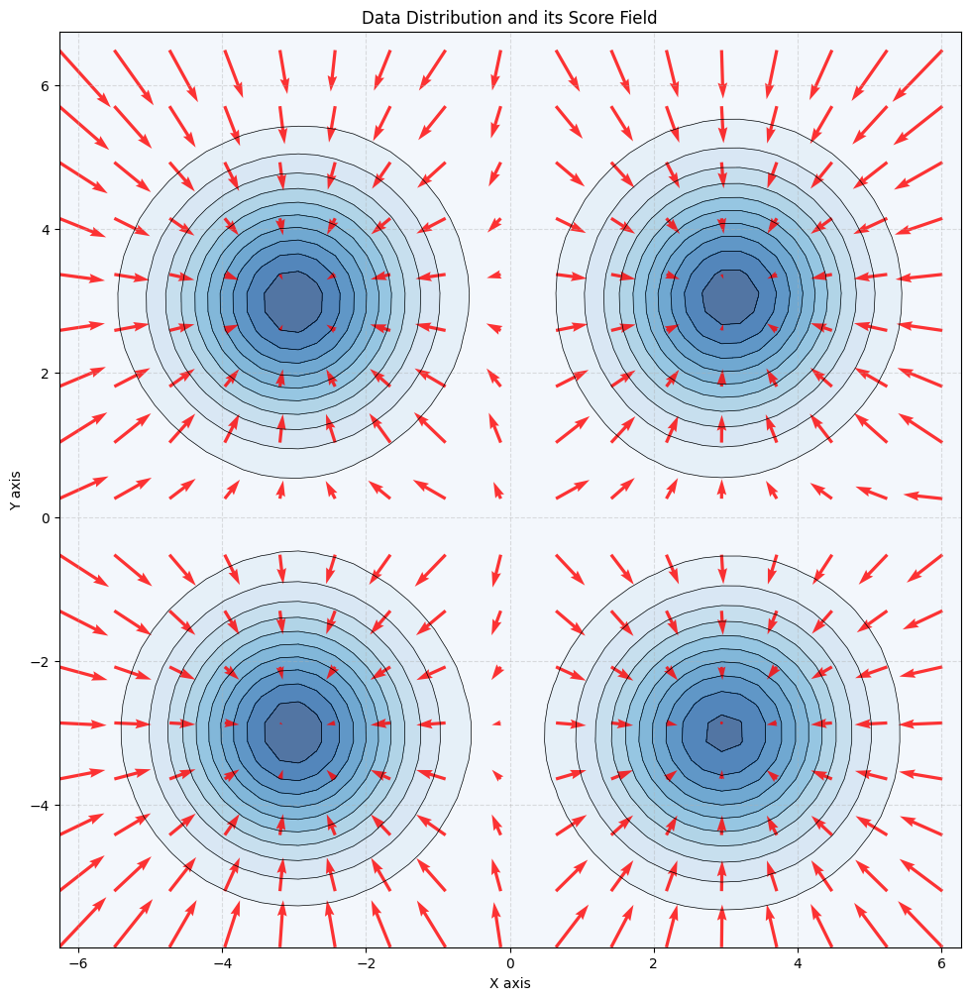

In [6]:
# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# 데이터 처리를 위한 numpy, 시각화를 위한 matplotlib,
# 데이터 분포 생성을 위한 scikit-learn을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from scipy.stats import gaussian_kde


# ==============================================================================
# 단계 2: 데이터 분포 생성
# ------------------------------------------------------------------------------
# 시각화를 위해 2차원 가우시안 혼합 분포 데이터를 생성합니다.
# 이 데이터 포인트들이 우리가 모델링하려는 데이터 분포 p(x)를 형성합니다.
# ==============================================================================
# centers: 데이터 군집의 중심 위치
# cluster_std: 데이터 군집의 표준편차 (퍼짐 정도)
# n_samples: 생성할 총 데이터 샘플 수
centers = [[-3, -3], [3, 3], [-3, 3], [3, -3]]
X, y = make_blobs(n_samples=2000, centers=centers, cluster_std=0.7, random_state=42)


# ==============================================================================
# 단계 3: Score Field 계산 준비
# ------------------------------------------------------------------------------
# 스코어(∇_x log p(x))를 계산하기 위해 먼저 데이터의 확률 밀도 함수 p(x)를 추정합니다.
# 여기서는 커널 밀도 추정(Kernel Density Estimation, KDE)을 사용하여 p(x)를 근사합니다.
# 그리고 스코어를 시각화할 공간(그리드)을 정의합니다.
# ==============================================================================
# 1. 커널 밀도 추정을 통해 확률 밀도 함수 p(x) 생성
kde = gaussian_kde(X.T)

# 2. 시각화를 위한 그리드 생성
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50),
                     np.linspace(y_min, y_max, 50))
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# 3. 로그 확률 밀도의 그래디언트(스코어) 계산
# 수치적 미분을 사용하여 각 그리드 포인트에서 그래디언트를 근사합니다.
# h는 미분을 위한 아주 작은 값입니다.
h = 1e-5
log_p_grid = np.log(kde(grid_points))

# x방향 편미분
dx = (np.log(kde(grid_points + np.array([[h], [0]]))) - log_p_grid) / h
# y방향 편미분
dy = (np.log(kde(grid_points + np.array([[0], [h]]))) - log_p_grid) / h

# 계산된 그래디언트를 벡터 필드 형태로 변환
score_field_x = dx.reshape(xx.shape)
score_field_y = dy.reshape(xx.shape)


# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 데이터 분포와 스코어 필드를 함께 그릴 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 12))


# ==============================================================================
# 단계 5: 데이터 분포 및 Score Field 시각화
# ------------------------------------------------------------------------------
# 1. 데이터 분포를 산점도(scatter) 또는 등고선(contour)으로 표시합니다.
# 2. 스코어 필드를 화살표(quiver)로 시각화합니다.
# ==============================================================================
# 1. 데이터 분포 시각화 (밀도 등고선)
# 그리드 각 지점에서의 확률 밀도 값을 계산하여 등고선으로 표현
Z = kde(grid_points).reshape(xx.shape)
ax.contourf(xx, yy, Z, levels=10, cmap='Blues', alpha=0.7)
ax.contour(xx, yy, Z, levels=10, colors='k', linewidths=0.5)

# 원본 데이터도 함께 표시 (선택 사항)
# ax.scatter(X[:, 0], X[:, 1], s=5, c='gray', alpha=0.3)

# 2. 스코어 필드 시각화 (화살표)
# quiver 함수를 사용하여 각 그리드 포인트(xx, yy)에서 계산된
# 스코어(score_field_x, score_field_y)를 화살표로 그립니다.
# 화살표가 너무 빽빽하지 않도록 일부만 샘플링하여 그립니다.
skip = 3
ax.quiver(xx[::skip, ::skip], yy[::skip, ::skip],
          score_field_x[::skip, ::skip], score_field_y[::skip, ::skip],
          color='red', alpha=0.8, scale=50)


# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 축 범위 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 추가 설정입니다.
# ==============================================================================
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_title('Data Distribution and its Score Field')
ax.set_aspect('equal', adjustable='box') # x, y 축 비율을 동일하게 설정
ax.grid(True, linestyle='--', alpha=0.4)


# ==============================================================================
# 단계 7: 최종 출력
# ------------------------------------------------------------------------------
# 완성된 그래프를 화면에 표시합니다.
# ==============================================================================
plt.show()

#### 3. Score Matching : Animated

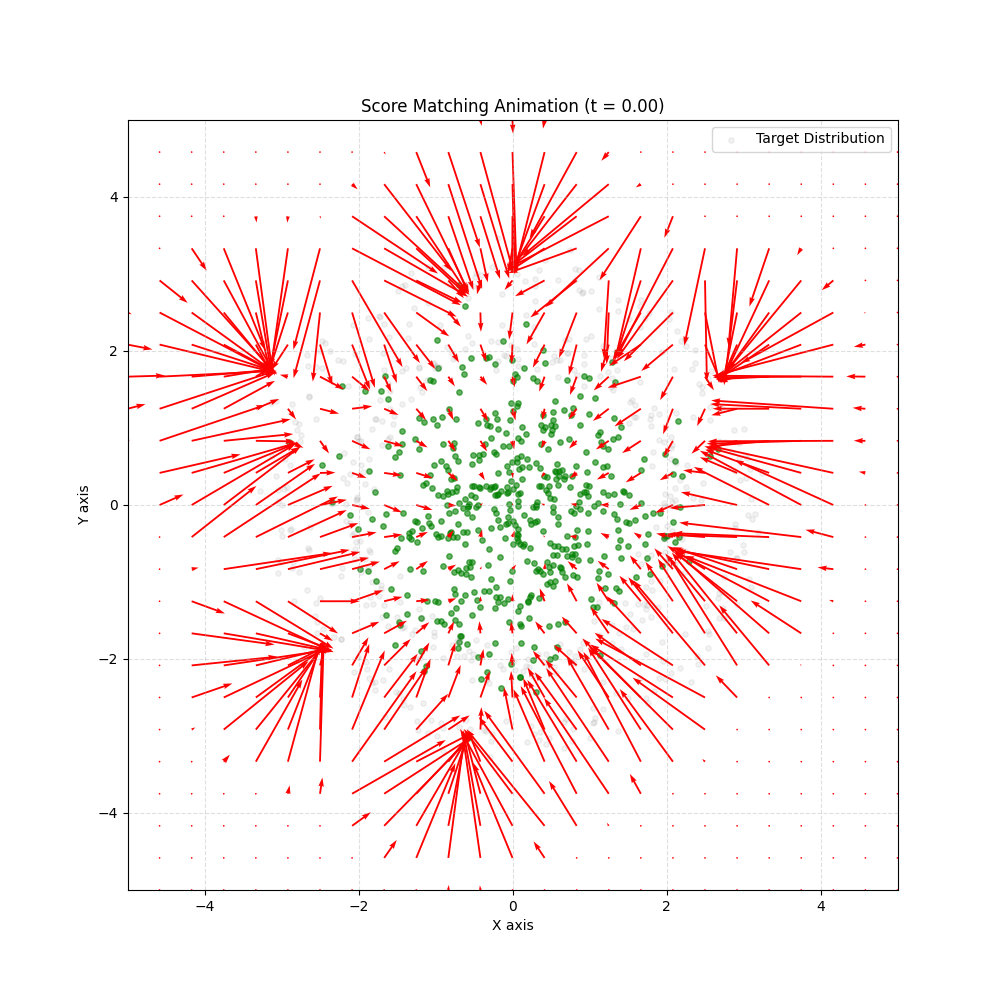

In [6]:
# ==============================================================================
# 단계 0: ipympl 백엔드 설정
# ------------------------------------------------------------------------------
# Jupyter Notebook/Lab에서 인터랙티브한 애니메이션을 표시하기 위해 설정합니다.
# 스크립트로 실행할 경우 이 줄은 주석 처리하거나 제거해야 합니다.
# ==============================================================================
%matplotlib widget

# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# 필요한 라이브러리들을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.stats import gaussian_kde
from sklearn.datasets import make_circles

# ==============================================================================
# 단계 2: 데이터 및 공간 정의
# ------------------------------------------------------------------------------
# 1. 목표 데이터 분포를 생성합니다. 여기서는 원형 데이터를 사용합니다.
# 2. 초기 노이즈 분포를 생성합니다.
# 3. 스코어 필드를 시각화할 2D 그리드 공간을 정의합니다.
# ==============================================================================
# 1. 목표 데이터 생성 (원형 분포)
n_samples = 500
X_target, _ = make_circles(n_samples=n_samples, factor=0.7, noise=0.05, random_state=42)
X_target *= 3 # 분포를 더 크게 만듭니다.

# 2. 초기 노이즈 생성 (가우시안 분포)
# 목표 데이터와 동일한 개수의 노이즈 샘플을 생성합니다.
X_noise = np.random.randn(n_samples, 2)

# 3. 시각화를 위한 그리드 생성 (연산량을 고려하여 25x25로 설정)
grid_res = 25
x_min, x_max = -5, 5
y_min, y_max = -5, 5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_res),
                     np.linspace(y_min, y_max, grid_res))
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# ==============================================================================
# 단계 3: 스코어 필드 계산 함수 정의
# ------------------------------------------------------------------------------
# 주어진 입자들의 분포에 대해 스코어 필드(벡터장)를 계산하는 함수입니다.
# ==============================================================================
def calculate_score_field(particles, grid_pts, grid_shape):
    """주어진 입자(particles) 분포의 스코어 필드를 계산합니다."""
    if len(particles) < 2 or np.all(particles == particles[0]):
        # 입자가 하나뿐이거나 모두 같은 위치에 있으면 KDE가 실패할 수 있음
        return np.zeros(grid_shape), np.zeros(grid_shape)
        
    kde = gaussian_kde(particles.T)
    log_p_grid = np.log(kde(grid_pts) + 1e-8) # log(0) 방지

    # 수치적 미분을 통한 그래디언트(스코어) 계산
    h = 1e-5
    dx = (np.log(kde(grid_pts + np.array([[h], [0]])) + 1e-8) - log_p_grid) / h
    dy = (np.log(kde(grid_pts + np.array([[0], [h]])) + 1e-8) - log_p_grid) / h

    return dx.reshape(grid_shape), dy.reshape(grid_shape)

# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 애니메이션을 표시할 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 10))

# ==============================================================================
# 단계 5: 필드 시각화 (초기 프레임 플로팅)
# ------------------------------------------------------------------------------
# 애니메이션의 첫 프레임(t=0)에 해당하는 입자 분포와 스코어 필드를 그립니다.
# 나중에 업데이트할 수 있도록 반환된 객체들을 변수에 저장합니다.
# ==============================================================================
# 1. 초기 입자 분포 (산점도)
scatter_plot = ax.scatter(X_noise[:, 0], X_noise[:, 1], alpha=0.6, s=15, color='green')

# 2. 목표 데이터 분포를 배경에 희미하게 표시
ax.scatter(X_target[:, 0], X_target[:, 1], alpha=0.1, s=15, color='gray', label='Target Distribution')

# 3. 초기 스코어 필드 (벡터장)
score_x_initial, score_y_initial = calculate_score_field(X_noise, grid_points, xx.shape)
quiver_plot = ax.quiver(xx, yy, score_x_initial, score_y_initial, color='red', scale=75)

# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 축 범위 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 설정입니다.
# ==============================================================================
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
title = ax.set_title('Score Matching Animation (t = 0.00)')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend()

# ==============================================================================
# 단계 7: 애니메이션 정의 및 최종 출력
# ------------------------------------------------------------------------------
# 각 프레임마다 호출될 업데이트 함수를 정의하고 애니메이션을 실행합니다.
# ==============================================================================
# 애니메이션 프레임 수
total_frames = 120

def update(frame):
    # 시간 t를 0에서 1로 진행시킵니다.
    t = frame / total_frames
    
    # 1. 입자 위치 업데이트 (선형 보간)
    # t=0일 때 노이즈, t=1일 때 목표 데이터가 되도록 위치를 보간합니다.
    current_particles = (1 - t) * X_noise + t * X_target
    scatter_plot.set_offsets(current_particles)
    
    # 2. 스코어 필드 업데이트
    # 현재 입자 분포에 대한 스코어 필드를 다시 계산합니다.
    score_x, score_y = calculate_score_field(current_particles, grid_points, xx.shape)
    quiver_plot.set_UVC(score_x, score_y)
    
    # 3. 타이틀 업데이트
    title.set_text(f'Score Matching Animation (t = {t:.2f})')
    
    # 업데이트된 객체들을 반환합니다.
    return scatter_plot, quiver_plot, title

# FuncAnimation 객체를 생성하여 애니메이션을 실행합니다.
ani = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)

# plt.show()를 호출하여 인터랙티브 위젯을 표시합니다.
plt.show()

# 애니메이션을 중지하고 싶을 경우 아래 코드의 주석을 해제하고 실행하세요.
# ani.event_source.stop()

- 착각할까봐 첨부. 스코어 필드는 공간 전역에 정의되어 있지 입자에 붙어 같이 운동하는게 아니다!

In [10]:
# ==============================================================================
# 단계 0: 백엔드 및 라이브러리 임포트
# ------------------------------------------------------------------------------
# HTML 렌더링을 위해 필요한 라이브러리들을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.stats import gaussian_kde
from sklearn.datasets import make_circles
from IPython.display import HTML

# ==============================================================================
# 단계 1: 데이터 분포 및 공간 정의
# ------------------------------------------------------------------------------
# 1. 출발(x₀, 노이즈) 및 목표(x₁, 데이터) 분포 생성
# 2. 스코어 필드를 시각화할 고정 그리드 공간 정의
# ==============================================================================
n_samples = 500
# 목표 데이터 (x₁) - 원형 분포
X1, _ = make_circles(n_samples=n_samples, factor=0.7, noise=0.05, random_state=42)
X1 *= 3

# 출발 노이즈 (x₀) - 가우시안 분포
X0 = np.random.randn(n_samples, 2)

# 스코어 필드를 그릴 그리드 (25x25, 연산량 고려)
grid_res = 25
x_coords = np.linspace(-5, 5, grid_res)
y_coords = np.linspace(-5, 5, grid_res)
xx, yy = np.meshgrid(x_coords, y_coords)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# ==============================================================================
# 단계 2: 스코어 필드 계산 함수 정의
# ------------------------------------------------------------------------------
# 주어진 입자 분포에 대해 공간 전체의 스코어 필드를 계산하는 함수입니다.
# ==============================================================================
def calculate_score_field(particles, grid_pts, grid_shape):
    """
    주어진 입자(particles) 분포의 스코어 필드(∇log p(x))를 계산합니다.
    """
    # 입자가 너무 적으면 KDE가 불안정하므로 빈 필드를 반환
    if len(particles) < 2:
        return np.zeros(grid_shape), np.zeros(grid_shape)
        
    # 1. 커널 밀도 추정(KDE)으로 확률 밀도 함수 p(x) 추정
    kde = gaussian_kde(particles.T)
    
    # 2. log(p(x)) 계산 (log(0) 방지를 위해 작은 값 epsilon 추가)
    epsilon = 1e-8
    log_p_grid = np.log(kde(grid_pts) + epsilon)

    # 3. 수치적 미분을 통해 그래디언트(스코어) 계산
    h = 1e-5
    dx = (np.log(kde(grid_pts + np.array([[h], [0]])) + epsilon) - log_p_grid) / h
    dy = (np.log(kde(grid_pts + np.array([[0], [h]])) + epsilon) - log_p_grid) / h

    return dx.reshape(grid_shape), dy.reshape(grid_shape)

# ==============================================================================
# 단계 3: 시각화 준비 및 초기 프레임 플로팅
# ------------------------------------------------------------------------------
# 애니메이션을 위한 Figure, Axes를 생성하고 첫 프레임(t=0)을 그립니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 10))
plt.close(fig) # HTML 출력을 위해 중복 그림 방지

# 목표 분포 배경
ax.scatter(X1[:, 0], X1[:, 1], alpha=0.1, color='blue', label='Target Distribution (t=1)')

# 움직이는 입자 (산점도)
scatter_plot = ax.scatter(X0[:, 0], X0[:, 1], alpha=0.6, color='green', zorder=3)

# 고정된 그리드 위의 스코어 필드 (Quiver)
U_initial, V_initial = calculate_score_field(X0, grid_points, xx.shape)
quiver_plot = ax.quiver(xx, yy, U_initial, V_initial, color='red', alpha=0.7, scale=75, zorder=2)

# ==============================================================================
# 단계 4: 그래프 꾸미기
# ------------------------------------------------------------------------------
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
title = ax.set_title('Score Matching: Particles in a Time-Varying Score Field (t = 0.00)')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend(loc='upper right')

# ==============================================================================
# 단계 5: 애니메이션 정의 및 HTML 출력
# ------------------------------------------------------------------------------
total_frames = 120

def update(frame):
    t = frame / total_frames
    
    # 1. 입자 위치 업데이트 (노이즈 -> 데이터로 보간)
    current_particles = (1 - t) * X0 + t * X1
    scatter_plot.set_offsets(current_particles)
    
    # 2. 고정 그리드 위의 스코어 필드 업데이트
    # *** 매 프레임마다 현재 입자 분포를 기반으로 전체 필드를 새로 계산 ***
    current_U, current_V = calculate_score_field(current_particles, grid_points, xx.shape)
    quiver_plot.set_UVC(current_U, current_V)
    
    # 3. 타이틀 업데이트
    title.set_text(f'Score Matching: Particles in a Time-Varying Score Field (t = {t:.2f})')
    
    return scatter_plot, quiver_plot, title

ani = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)
HTML(ani.to_html5_video())

#### 4. Conditional Vector Field

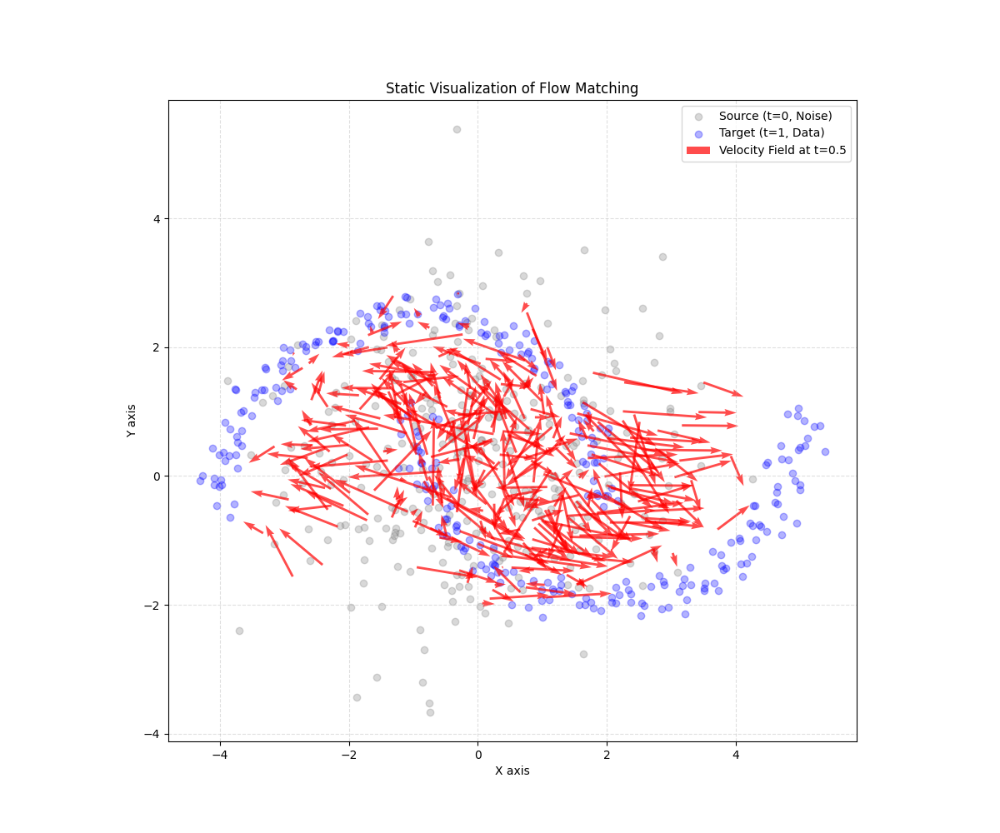

In [9]:
# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# 데이터 처리와 시각화를 위한 라이브러리들을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons

# ==============================================================================
# 단계 2: 데이터 분포 생성
# ------------------------------------------------------------------------------
# 1. 출발 분포(prior distribution): 가우시안 노이즈 (x₀)
# 2. 목표 분포(target distribution): 두 개의 달 모양 데이터 (x₁)
# ==============================================================================
n_samples = 300
# 1. 목표 데이터 (x₁)
X1, _ = make_moons(n_samples=n_samples, noise=0.05, random_state=42)
X1 = X1 * 3 + np.array([-1, -0.5]) # 분포의 크기와 위치 조정

# 2. 출발 노이즈 (x₀)
X0 = np.random.randn(n_samples, 2) * 1.5 # x1과 비슷한 스케일의 노이즈

# ==============================================================================
# 단계 3: 조건부 벡터 필드(Flow) 정의
# ------------------------------------------------------------------------------
# Flow Matching의 가장 간단한 형태인 직선 경로를 가정합니다.
# 속도 벡터 v = x₁ - x₀ 입니다.
# 여기서는 t=0.5 시점의 입자 위치와 해당 위치에서의 속도 벡터를 계산합니다.
# ==============================================================================
t = 0.5
# t=0.5에서의 입자 위치
X_t = (1 - t) * X0 + t * X1
# 각 입자 경로의 속도 벡터 (이 경우 시간에 무관하게 상수)
V = X1 - X0

# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 정적 벡터 필드를 그릴 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 10))

# ==============================================================================
# 단계 5: 분포 및 벡터 필드 시각화
# ------------------------------------------------------------------------------
# 1. 출발(x₀) 및 목표(x₁) 분포를 산점도로 표시합니다.
# 2. t=0.5 시점에서의 벡터 필드를 화살표(quiver)로 시각화합니다.
# ==============================================================================
# 출발 분포 (x₀)
ax.scatter(X0[:, 0], X0[:, 1], alpha=0.3, label='Source (t=0, Noise)', color='gray')
# 목표 분포 (x₁)
ax.scatter(X1[:, 0], X1[:, 1], alpha=0.3, label='Target (t=1, Data)', color='blue')

# t=0.5에서의 입자 위치와 벡터 필드
ax.quiver(X_t[:, 0], X_t[:, 1], V[:, 0], V[:, 1],
          color='red', alpha=0.7, scale=50, label='Velocity Field at t=0.5')

# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 범례 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 설정입니다.
# ==============================================================================
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_title('Static Visualization of Flow Matching')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend()

# ==============================================================================
# 단계 7: 최종 출력
# ------------------------------------------------------------------------------
# 완성된 그래프를 화면에 표시합니다.
# ==============================================================================
plt.show()

#### 4. Flow Matching : Animated

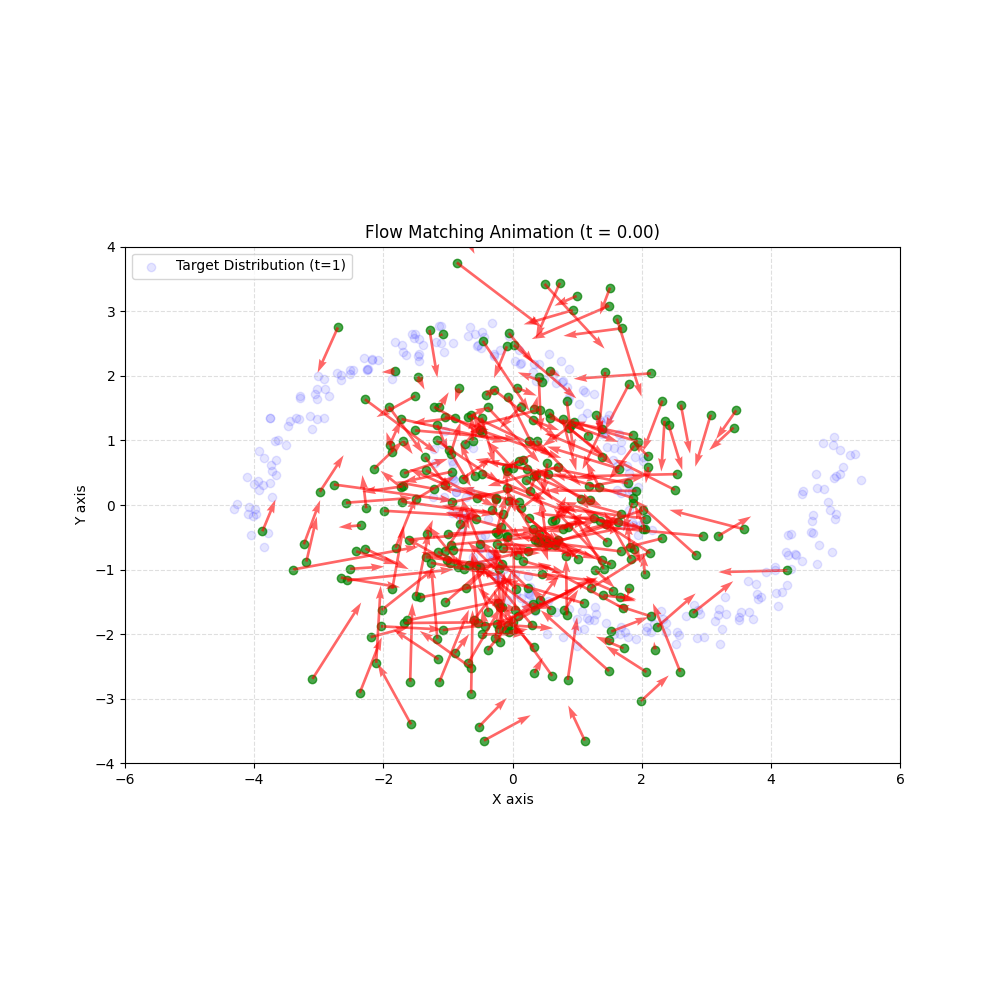

In [1]:
# ==============================================================================
# 단계 0: ipympl 백엔드 설정
# ------------------------------------------------------------------------------
# Jupyter 환경에서 인터랙티브 애니메이션을 위해 설정합니다.
# ==============================================================================
%matplotlib widget

# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.datasets import make_moons

# ==============================================================================
# 단계 2: 데이터 분포 생성
# ------------------------------------------------------------------------------
# 정적 시각화와 동일하게 출발(x₀) 및 목표(x₁) 분포를 생성합니다.
# ==============================================================================
n_samples = 300
X1, _ = make_moons(n_samples=n_samples, noise=0.05, random_state=42)
X1 = X1 * 3 + np.array([-1, -0.5])
X0 = np.random.randn(n_samples, 2) * 1.5

# ==============================================================================
# 단계 3: Flow(속도 벡터) 정의
# ------------------------------------------------------------------------------
# 각 입자 쌍 (x₀, x₁)에 대한 속도 벡터 v = x₁ - x₀ 를 미리 계산합니다.
# 이 속도 벡터는 이 예시(직선 경로)에서는 시간에 따라 변하지 않습니다.
# ==============================================================================
V = X1 - X0

# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 애니메이션을 표시할 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 10))

# ==============================================================================
# 단계 5: 필드 시각화 (초기 프레임 플로팅)
# ------------------------------------------------------------------------------
# 애니메이션의 첫 프레임(t=0)에 해당하는 입자 위치와 벡터 필드를 그립니다.
# 업데이트를 위해 반환된 객체들을 변수에 저장합니다.
# ==============================================================================
# 목표 분포를 배경에 희미하게 표시
ax.scatter(X1[:, 0], X1[:, 1], alpha=0.1, color='blue', label='Target Distribution (t=1)')

# t=0에서의 입자 위치 (산점도)
scatter_plot = ax.scatter(X0[:, 0], X0[:, 1], alpha=0.7, color='green')

# t=0에서의 벡터 필드 (화살표). 화살표의 시작점은 입자 위치.
quiver_plot = ax.quiver(X0[:, 0], X0[:, 1], V[:, 0], V[:, 1],
                        color='red', alpha=0.6, scale=50)

# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 축 범위 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 설정입니다.
# ==============================================================================
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
title = ax.set_title('Flow Matching Animation (t = 0.00)')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-6, 6)
ax.set_ylim(-4, 4)
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend(loc='upper left')

# ==============================================================================
# 단계 7: 애니메이션 정의 및 최종 출력
# ------------------------------------------------------------------------------
# 각 프레임마다 호출될 업데이트 함수를 정의하고 애니메이션을 실행합니다.
# ==============================================================================
total_frames = 120

def update(frame):
    # 시간 t를 0에서 1로 진행시킵니다.
    t = frame / total_frames

    # 1. 입자 위치 업데이트 (선형 보간)
    current_particles = (1 - t) * X0 + t * X1
    scatter_plot.set_offsets(current_particles)

    # 2. 벡터 필드 위치 업데이트
    # 속도 벡터 V 자체는 변하지 않지만, 화살표의 시작 위치가 입자를 따라가야 합니다.
    quiver_plot.set_offsets(current_particles)

    # 3. 타이틀 업데이트
    title.set_text(f'Flow Matching Animation (t = {t:.2f})')

    return scatter_plot, quiver_plot, title

# FuncAnimation 객체를 생성하여 애니메이션을 실행합니다.
ani = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)

# plt.show()를 호출하여 인터랙티브 위젯을 표시합니다.
plt.show()

#### 4. Flow Matching : Animated (HTML)

- 위와 같은 인터랙티브 방식의 경우 다른 셀의 작동과 꼬여서 잔상이 남는 경우가 있기 때문에 그 경우는 껐다 키거나 아래처럼 HTML 방식을 활용할 것.

In [3]:
# ==============================================================================
# 단계 0: 백엔드 설정 관련 안내
# ------------------------------------------------------------------------------
# 이 코드는 애니메이션을 HTML5 비디오로 생성하므로, 특정 matplotlib 백엔드
# 설정(%matplotlib widget 등)이 필요 없습니다.
# ==============================================================================

# ==============================================================================
# 단계 1: 라이브러리 임포트
# ------------------------------------------------------------------------------
# HTML 표시를 위해 IPython.display의 HTML을 추가로 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.datasets import make_moons
from IPython.display import HTML # HTML 렌더링을 위한 라이브러리

# ==============================================================================
# 단계 2: 데이터 분포 생성
# ------------------------------------------------------------------------------
# 출발(x₀) 및 목표(x₁) 분포를 생성합니다.
# ==============================================================================
n_samples = 300
X1, _ = make_moons(n_samples=n_samples, noise=0.05, random_state=42)
X1 = X1 * 3 + np.array([-1, -0.5])
X0 = np.random.randn(n_samples, 2) * 1.5

# ==============================================================================
# 단계 3: Flow(속도 벡터) 정의
# ------------------------------------------------------------------------------
# 각 입자 쌍 (x₀, x₁)에 대한 속도 벡터 v = x₁ - x₀ 를 미리 계산합니다.
# ==============================================================================
V = X1 - X0

# ==============================================================================
# 단계 4: 시각화 준비 (Figure 및 Axes 객체 생성)
# ------------------------------------------------------------------------------
# 애니메이션을 표시할 그림(figure)과 좌표축(axes)을 생성합니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 10))

# ==============================================================================
# 단계 5: 필드 시각화 (초기 프레임 플로팅)
# ------------------------------------------------------------------------------
# 애니메이션의 첫 프레임(t=0)에 해당하는 입자 위치와 벡터 필드를 그립니다.
# 업데이트를 위해 반환된 객체들을 변수에 저장합니다.
# ==============================================================================
# 목표 분포를 배경에 희미하게 표시
ax.scatter(X1[:, 0], X1[:, 1], alpha=0.1, color='blue', label='Target Distribution (t=1)')

# t=0에서의 입자 위치 (산점도)
scatter_plot = ax.scatter(X0[:, 0], X0[:, 1], alpha=0.7, color='green')

# t=0에서의 벡터 필드 (화살표)
quiver_plot = ax.quiver(X0[:, 0], X0[:, 1], V[:, 0], V[:, 1],
                        color='red', alpha=0.6, scale=50)

# ==============================================================================
# 단계 6: 그래프 꾸미기 (레이블, 타이틀, 축 범위 등)
# ------------------------------------------------------------------------------
# 그래프의 가독성을 높이기 위한 설정입니다.
# ==============================================================================
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
title = ax.set_title('Flow Matching Animation (t = 0.00)')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-6, 6)
ax.set_ylim(-4, 4)
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend(loc='upper left')

# ==============================================================================
# 단계 7: 애니메이션 정의 및 HTML 최종 출력
# ------------------------------------------------------------------------------
# 각 프레임마다 호출될 업데이트 함수를 정의하고, 애니메이션을 생성한 후
# HTML5 비디오로 변환하여 출력합니다.
# ==============================================================================
total_frames = 120

def update(frame):
    # 시간 t를 0에서 1로 진행시킵니다.
    t = frame / total_frames

    # 1. 입자 위치 업데이트 (선형 보간)
    current_particles = (1 - t) * X0 + t * X1
    scatter_plot.set_offsets(current_particles)

    # 2. 벡터 필드 위치 업데이트
    quiver_plot.set_offsets(current_particles)

    # 3. 타이틀 업데이트
    title.set_text(f'Flow Matching Animation (t = {t:.2f})')

    return scatter_plot, quiver_plot, title

# FuncAnimation 객체를 생성합니다.
ani = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)

# 애니메이션을 HTML5 비디오로 변환합니다.
html_video = ani.to_html5_video()

# Jupyter Notebook에 정적 이미지가 중복으로 표시되는 것을 방지하기 위해 close() 호출
plt.close(fig)

# 생성된 HTML 비디오를 출력합니다.
HTML(html_video)

- 혹시나 착각할까봐 아래를 첨부. 벡터가 각 샘플 입자에 '붙어서' 움직이는 것이 아니다! 위에는 그 시각 샘플의 위치에서의 벡터만 보여준 것.
- "시간에 따라 변화하는, 공간 전체에 정의된 벡터장(Vector Field)이 존재하고, 모든 샘플 입자는 단지 그 벡터장의 흐름을 따라 운동하는 것입니다."
- Flow Matching이 샘플 자체의 운동을 배우는 것이 아니라, 샘플을 움직이게 하는 근원적인 시공간 벡터장(spatiotemporal vector field)을 학습.

In [8]:
# ==============================================================================
# 단계 0: 백엔드 및 라이브러리 임포트
# ------------------------------------------------------------------------------
# HTML 렌더링을 위해 필요한 라이브러리들을 가져옵니다.
# ==============================================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.datasets import make_moons
from IPython.display import HTML

# ==============================================================================
# 단계 1: 데이터 분포 및 공간 정의
# ------------------------------------------------------------------------------
# 1. 출발(x₀) 및 목표(x₁) 분포 생성
# 2. 벡터장을 시각화할 고정 그리드 공간 정의
# ==============================================================================
n_samples = 300
X1, _ = make_moons(n_samples=n_samples, noise=0.05, random_state=42)
X1 = X1 * 3 + np.array([-1, -0.5])
X0 = np.random.randn(n_samples, 2) * 1.5

# 벡터장을 그릴 그리드 (20x20)
grid_res = 20
x_coords = np.linspace(-6, 6, grid_res)
y_coords = np.linspace(-4, 4, grid_res)
xx, yy = np.meshgrid(x_coords, y_coords)
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# ==============================================================================
# 단계 2: Flow 및 벡터장 추정 함수 정의
# ------------------------------------------------------------------------------
# 1. 각 입자 경로의 속도 벡터 V = x₁ - x₀ 계산
# 2. 특정 시점 t, 특정 그리드 위치 x에서의 속도를 추정하는 함수 정의
# ==============================================================================
V = X1 - X0 # 각 샘플 경로의 상수 속도 벡터

def estimate_velocity_field(current_particles, particle_velocities, grid_pts):
    """
    그리드 각 지점에서의 속도를 주변 입자들의 속도로부터 추정(보간)합니다.
    가까운 입자의 속도에 더 큰 가중치를 부여하는 방식 (가우시안 가중치)
    """
    grid_velocities = np.zeros_like(grid_pts, dtype=float)
    
    # 가중치 계산을 위한 스케일 파라미터 (대역폭)
    sigma = 0.5
    
    for i, pt in enumerate(grid_pts):
        # 각 그리드 포인트와 모든 입자 사이의 거리 계산
        distances_sq = np.sum((current_particles - pt)**2, axis=1)
        
        # 거리에 따른 가우시안 가중치 계산
        weights = np.exp(-distances_sq / (2 * sigma**2))
        
        # 가중치가 너무 작아 0이 되는 경우 방지
        if np.sum(weights) < 1e-8:
            continue
            
        # 가중 평균을 통해 속도 벡터 계산
        weighted_avg_velocity = np.sum(particle_velocities * weights[:, np.newaxis], axis=0) / np.sum(weights)
        grid_velocities[i] = weighted_avg_velocity
        
    return grid_velocities[:, 0].reshape(grid_res, grid_res), grid_velocities[:, 1].reshape(grid_res, grid_res)

# ==============================================================================
# 단계 3: 시각화 준비 및 초기 프레임 플로팅
# ------------------------------------------------------------------------------
# 애니메이션을 위한 Figure, Axes를 생성하고 첫 프레임을 그립니다.
# ==============================================================================
fig, ax = plt.subplots(figsize=(10, 10))
plt.close(fig) # HTML 출력을 위해 중복 그림 방지

# 목표 분포 배경
ax.scatter(X1[:, 0], X1[:, 1], alpha=0.1, color='blue', label='Target Distribution (t=1)')

# 움직이는 입자 (산점도)
scatter_plot = ax.scatter(X0[:, 0], X0[:, 1], alpha=0.7, color='green', zorder=3)

# 고정된 그리드 위의 벡터장 (Quiver)
U_initial, V_initial = estimate_velocity_field(X0, V, grid_points)
quiver_plot = ax.quiver(xx, yy, U_initial, V_initial, color='red', alpha=0.6, scale=50, zorder=2)

# ==============================================================================
# 단계 4: 그래프 꾸미기
# ------------------------------------------------------------------------------
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
title = ax.set_title('Flow Matching: Particles Moving in a Time-Varying Vector Field (t = 0.00)')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-6, 6)
ax.set_ylim(-4, 4)
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend(loc='upper left')

# ==============================================================================
# 단계 5: 애니메이션 정의 및 HTML 출력
# ------------------------------------------------------------------------------
total_frames = 120

def update(frame):
    t = frame / total_frames
    
    # 1. 입자 위치 업데이트
    current_particles = (1 - t) * X0 + t * X1
    scatter_plot.set_offsets(current_particles)
    
    # 2. 고정 그리드 위의 벡터장 업데이트
    # 현재 입자 위치를 기반으로 전체 필드를 다시 계산
    current_U, current_V = estimate_velocity_field(current_particles, V, grid_points)
    quiver_plot.set_UVC(current_U, current_V)
    
    # 3. 타이틀 업데이트
    title.set_text(f'Flow Matching: Particles Moving in a Time-Varying Vector Field (t = {t:.2f})')
    
    return scatter_plot, quiver_plot, title

ani = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)
HTML(ani.to_html5_video())